In [1]:
#test

# Test: Visualize 3D Detection Dataset

> This is a visualization test of the dataset.

The visualisations are created for only a few frames, for performance reasons. It is not recommended to run this notebook via "jupyter lab" as e.g. VSCode has severe performance issues.

In [2]:
import os
import numpy as np
from collections import namedtuple
from dtk.configs.detection import DetectionConfig
import matplotlib.pyplot as plt
import dtk.visualizations.plot3d as p3d

from kia_dataset.io.dfki_kia_dataset import KIADataset, SPLIT_TRAIN, SEMANTIC_MAPPING
from kia_dataset.io.dfki_kia_visualizations import *

First implement a visualization for the 3d boxes.

In [3]:
def visualize(dataset, start=50, stop=351, step=100):
    # Get Features and Values from Dataset
    for i in range(start, stop, step):
        features, targets = dataset[i]
        img = visualize_box3d(features.image, targets.detections_3d, features.projection, targets.sample_token)
        plt.figure(figsize=(12,8))
        plt.imshow(img)
        plt.show()

        scan = features.scan
        if config.data_use_world_coordinates:
            img = visualize_scan_bev(scan, targets.detections_3d, targets.sample_token, features.ego_to_world)
        else:
            img = visualize_scan_bev(scan, targets.detections_3d, targets.sample_token)
        plt.figure(figsize=(16,8))
        plt.imshow(img)
        plt.show()

Then we define our inputs and outputs as well as the shared base config.

In [4]:
# Define Inputs/Outputs and Dataset
# Supported Fields: "image", "depth", "scan", "projection", "ego_to_world"
# "detections_2d", "detections_3d", "instance_segmentation", "semantic_segmentation", "sample_token"
MyInput = namedtuple("MyInput", ["image", "scan", "projection", "ego_to_world"])
MyOutput = namedtuple("MyOutput", ["detections_2d", "detections_3d", "sample_token"])

# Make a basic config.
config = DetectionConfig(training_name="vis", data_path=os.path.join(os.environ["DATA_PATH"], "KIA_Dataset"), training_results_path="")
config.data_company = "bit"
config.data_exr_images = False

## Tranche 3 (World CoSy)

(Please note that the data_use_world_coordinates is broken for Tranche 3.)

Here we define what sequences to load and that we want to use the global coordinate system.

get_scan: 163 ms
[2021-02-24 11:38:18] WARN Using fallback prefix 'world_', as 'world-' did not exist.


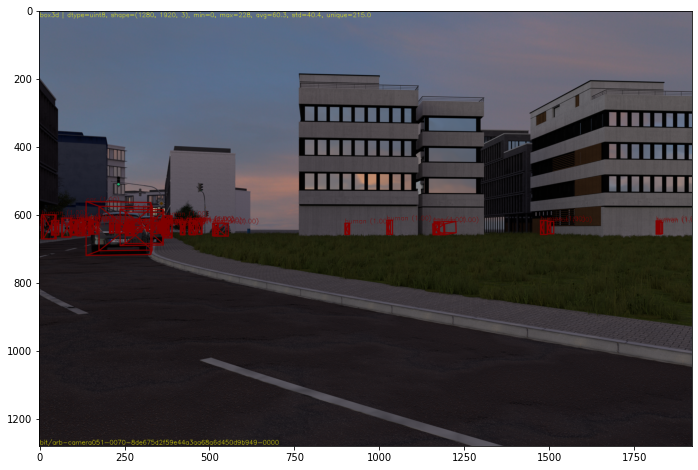

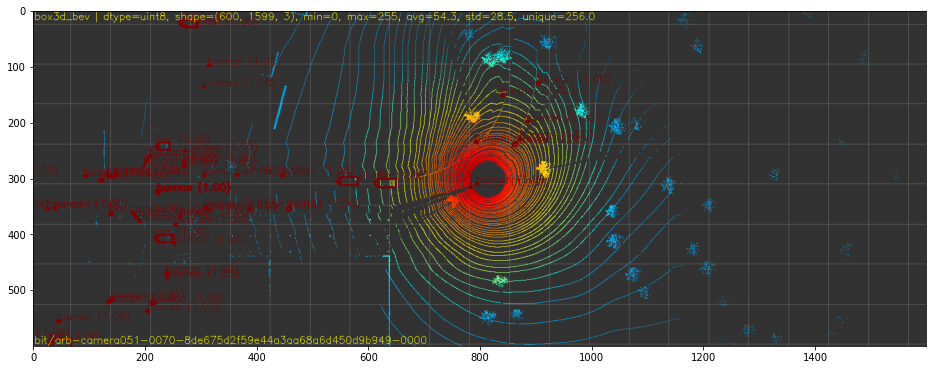

get_scan: 174 ms


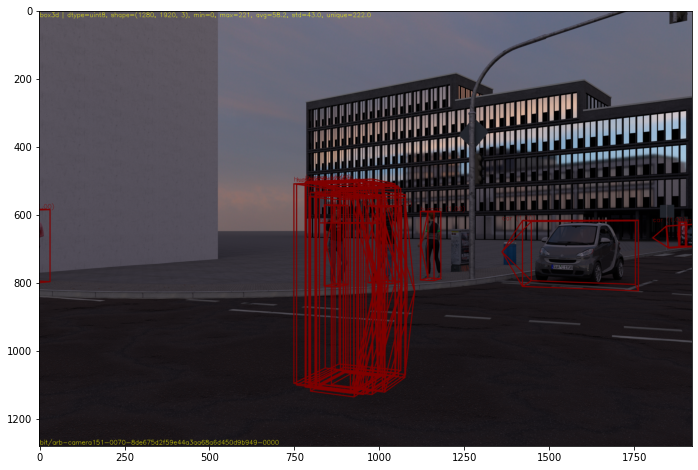

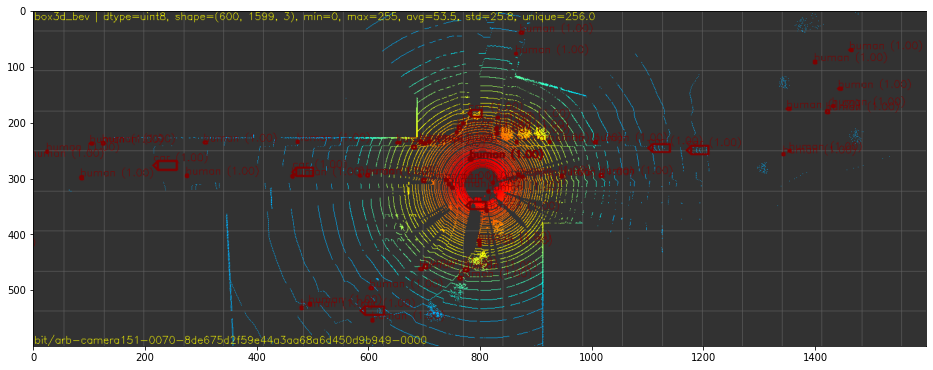

get_scan: 274 ms


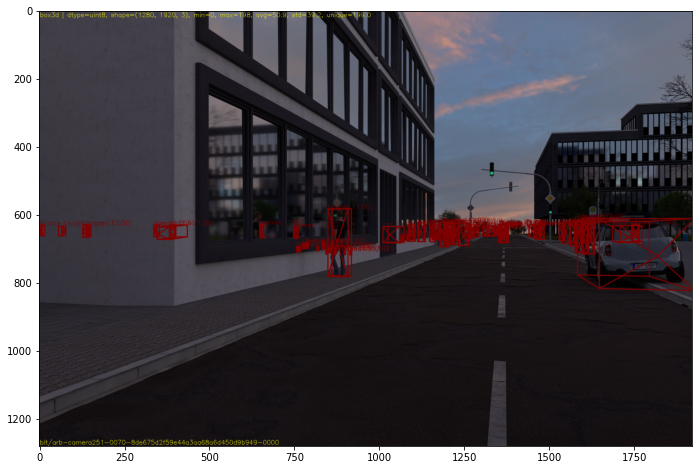

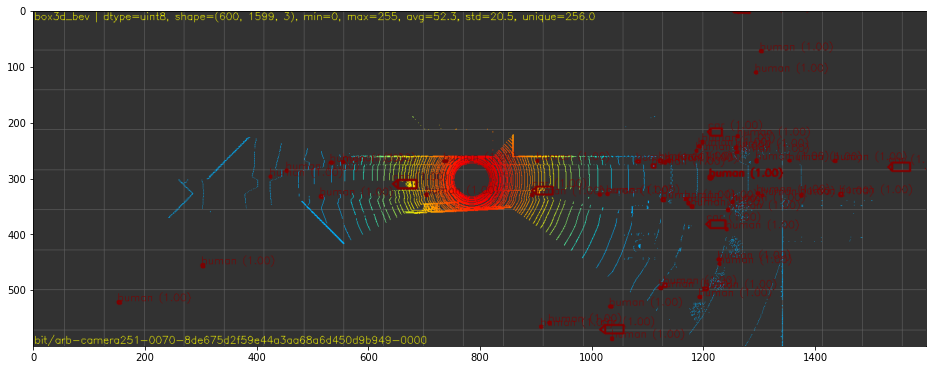

get_scan: 207 ms


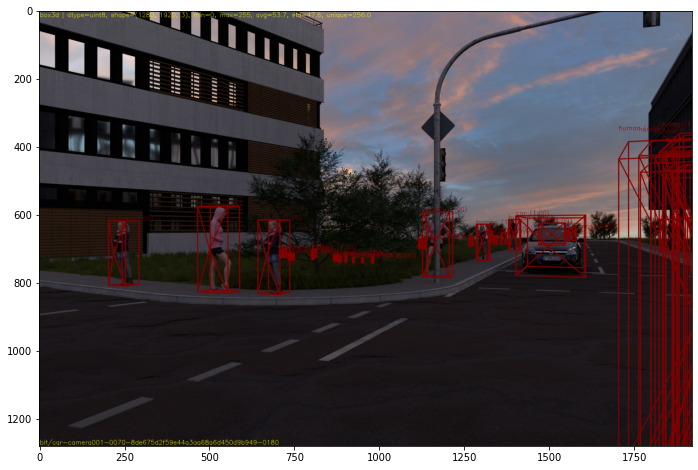

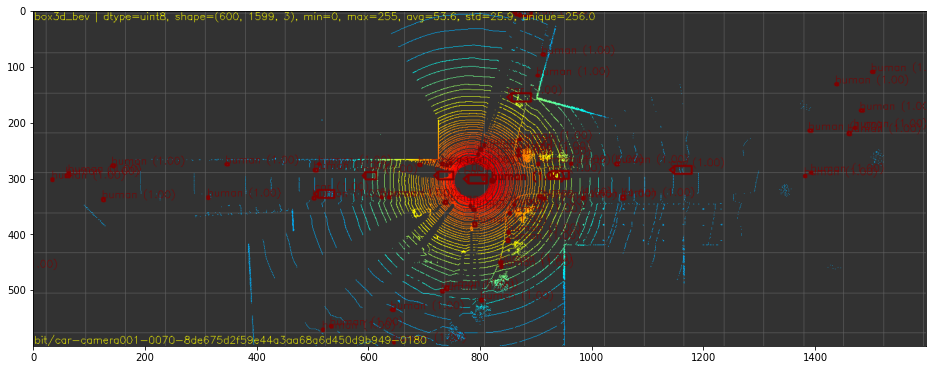

In [5]:
config.data_use_world_coordinates = True
config.data_sequences = [70]
dataset = KIADataset(config, SPLIT_TRAIN, InputType=MyInput, OutputType=MyOutput)
visualize(dataset)

## Tranche 3 (Camera Cosy)

get_scan: 161 ms


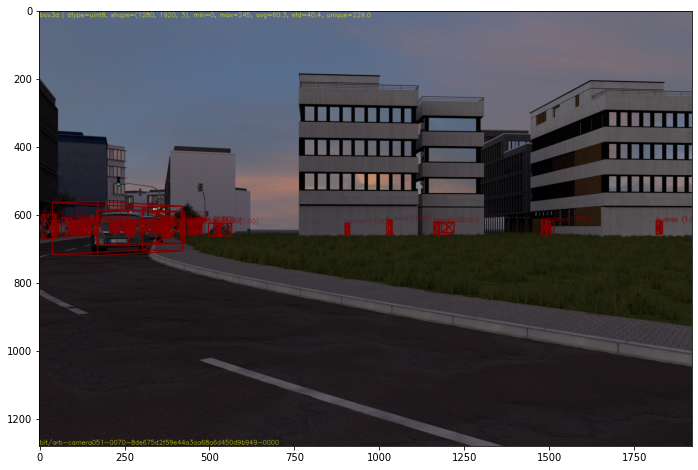

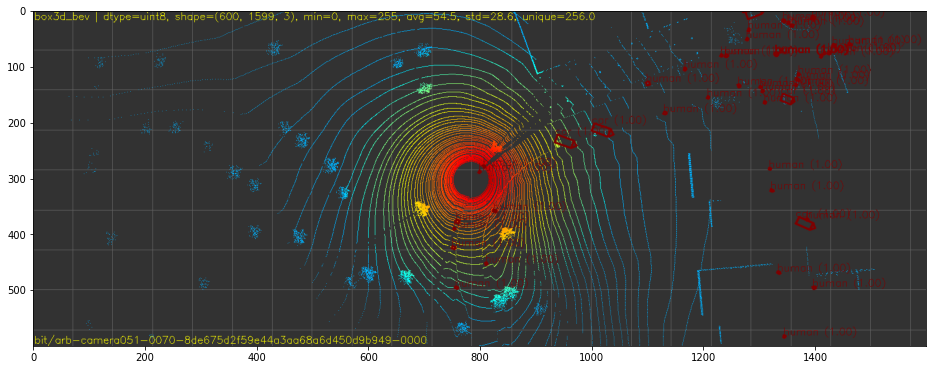

get_scan: 177 ms


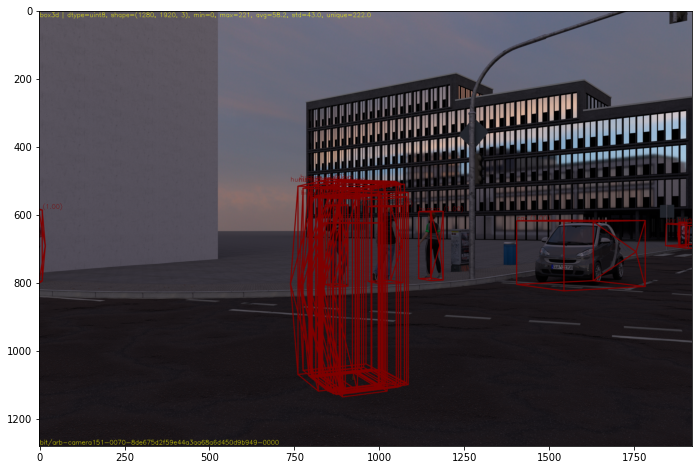

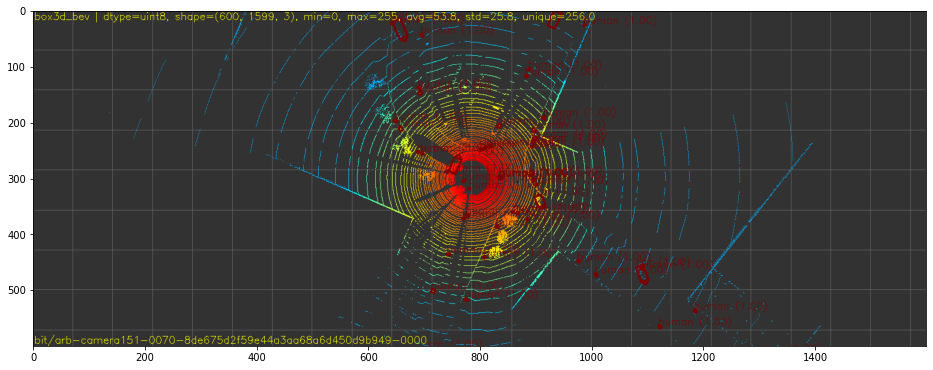

get_scan: 203 ms


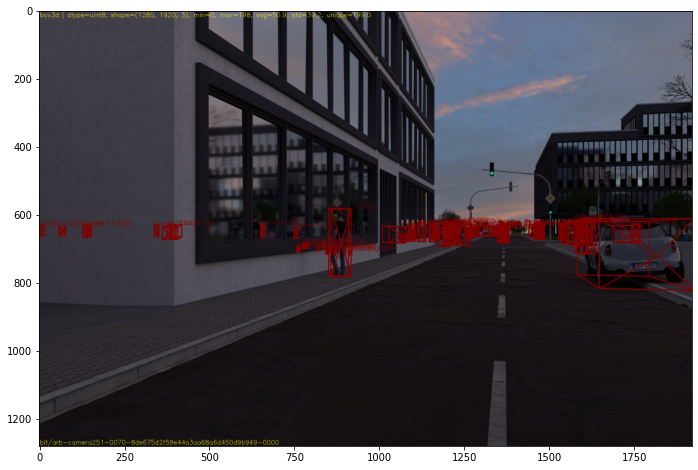

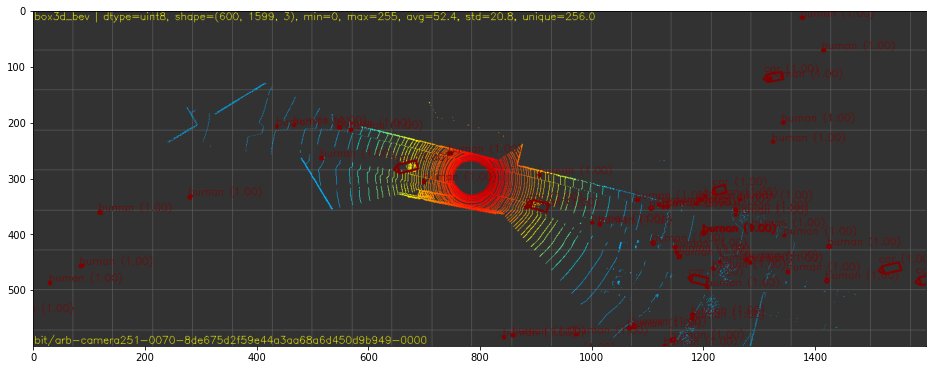

get_scan: 172 ms


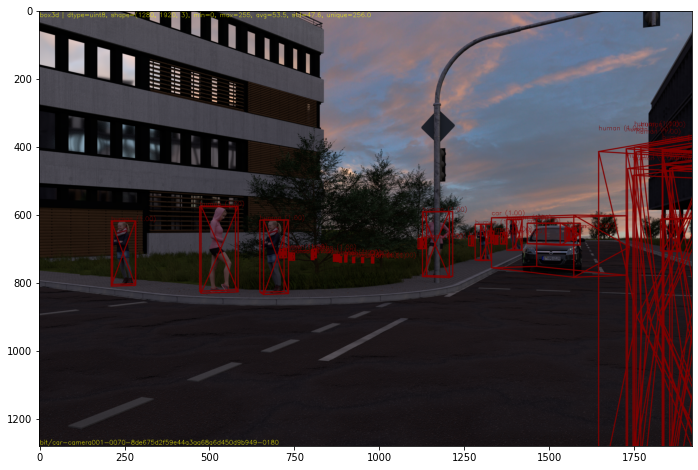

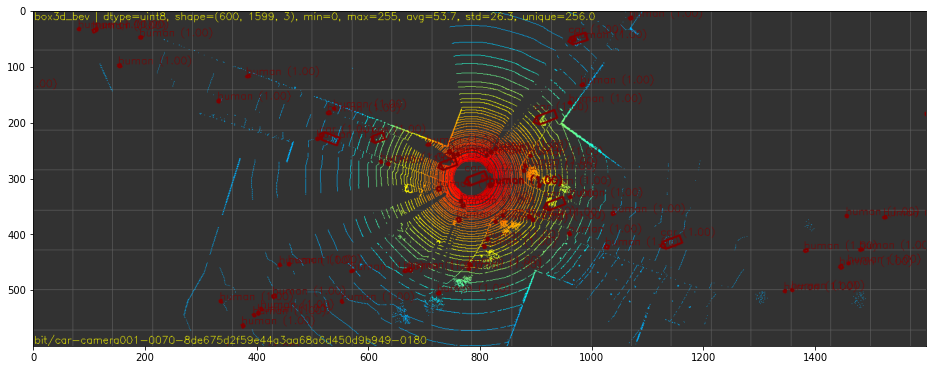

In [6]:
config.data_use_world_coordinates = False
config.data_sequences = [70]
dataset = KIADataset(config, SPLIT_TRAIN, InputType=MyInput, OutputType=MyOutput)
visualize(dataset)

## Tranche 4 (World Cosy)

[2021-02-24 11:38:36] WARN No LiDAR in data. Fake scan with 0 points.
get_scan: 0 ms


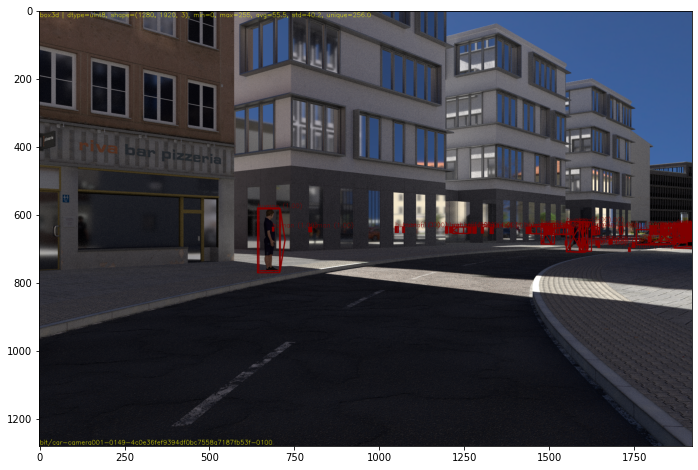

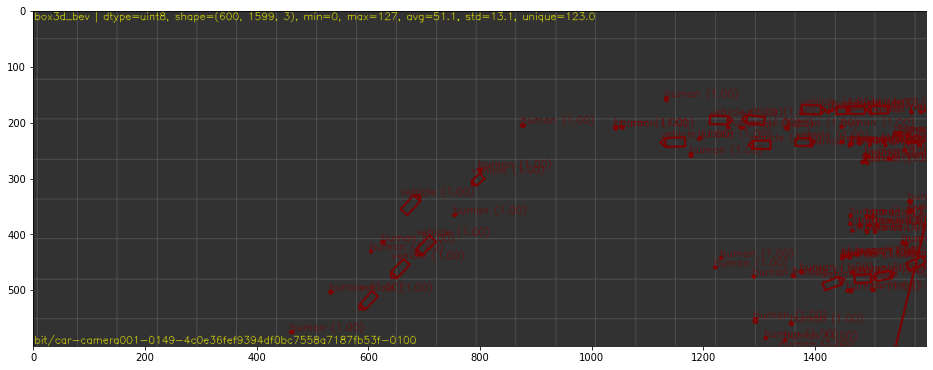

get_scan: 0 ms


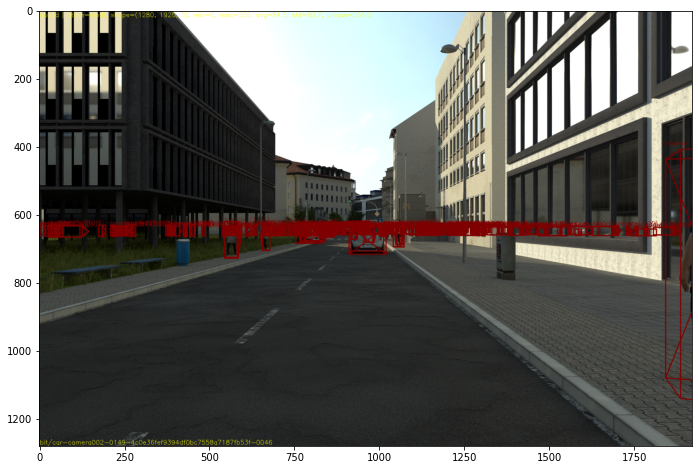

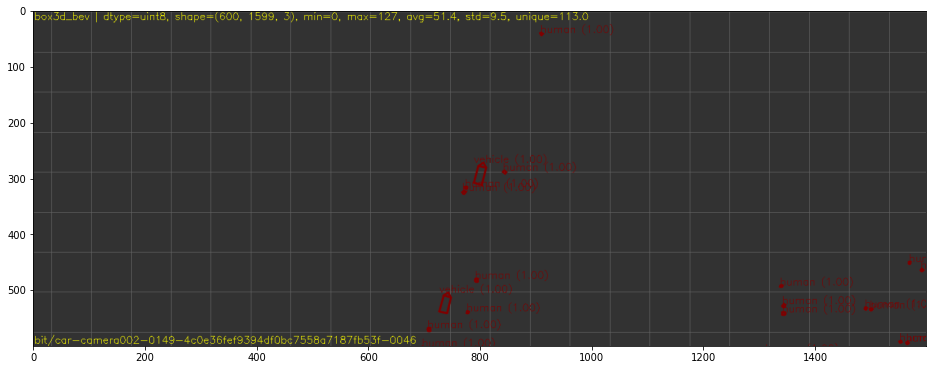

get_scan: 0 ms


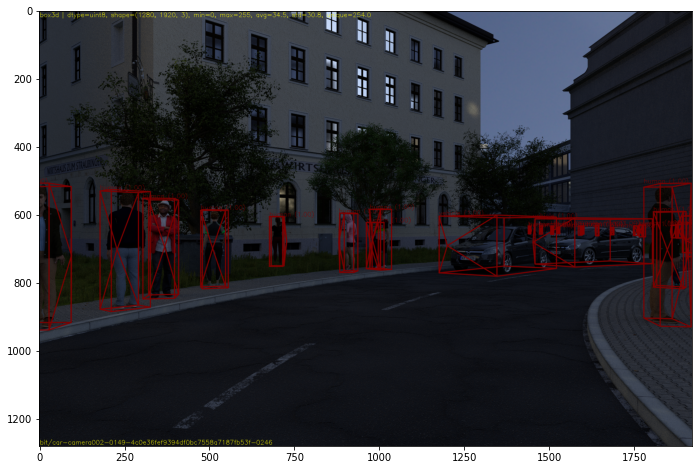

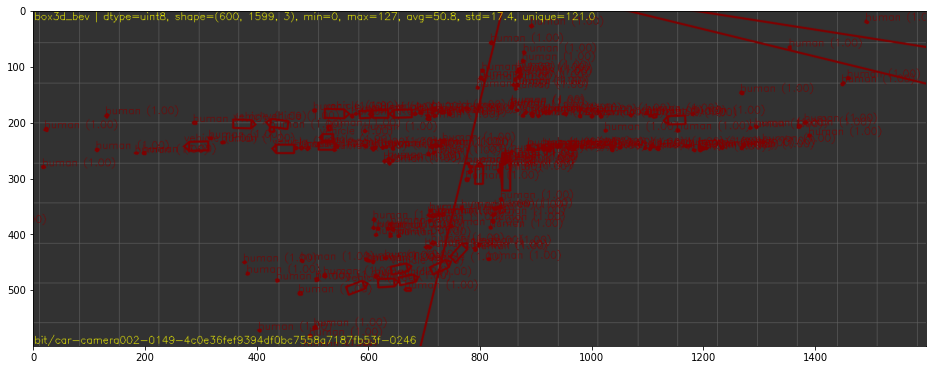

get_scan: 0 ms


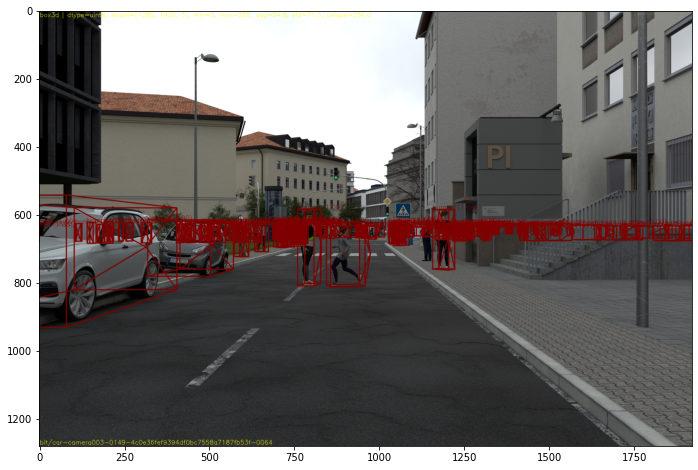

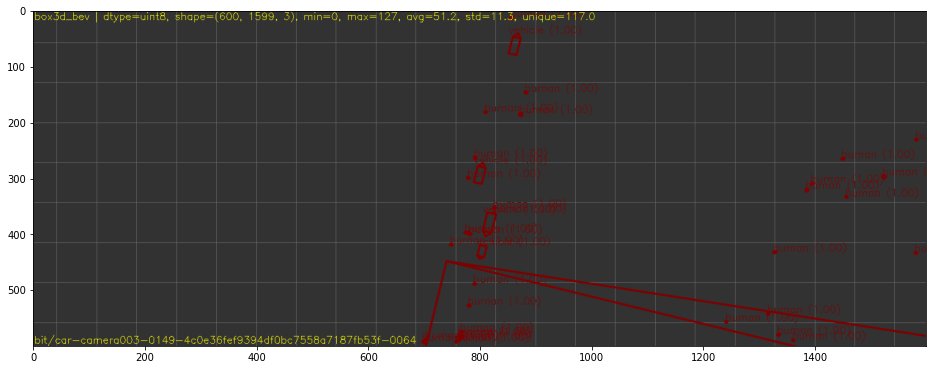

In [7]:
config.data_use_world_coordinates = True
config.data_sequences = [149]
dataset = KIADataset(config, SPLIT_TRAIN, InputType=MyInput, OutputType=MyOutput)
visualize(dataset)

## Tranche 4 (Camera Cosy)

get_scan: 0 ms


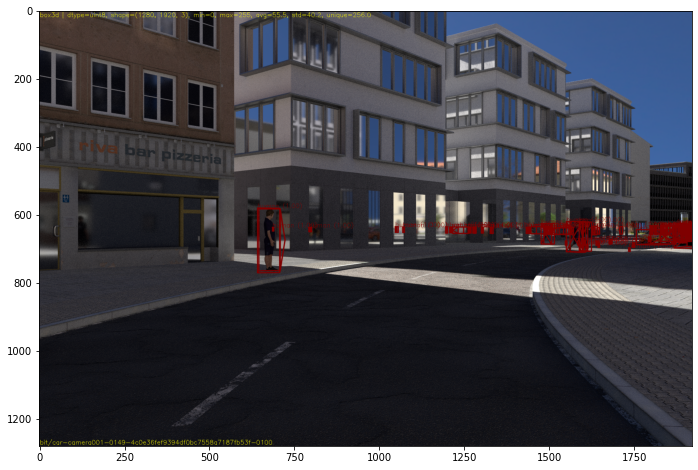

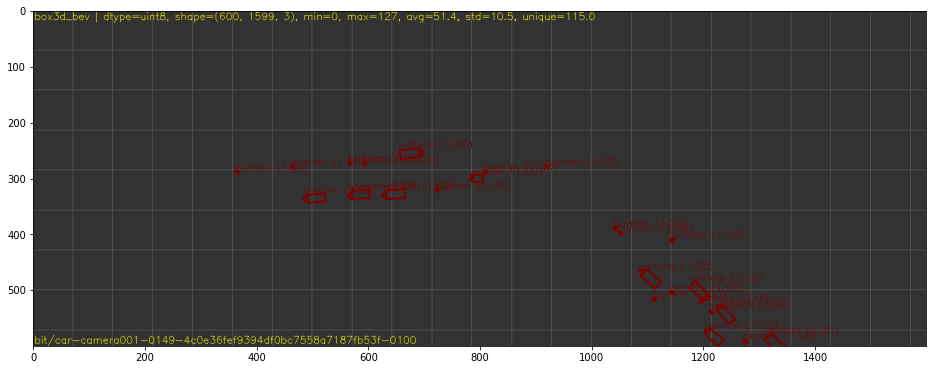

get_scan: 0 ms


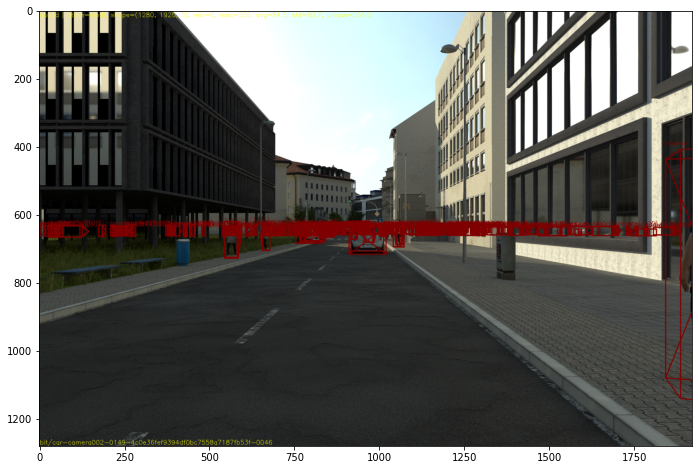

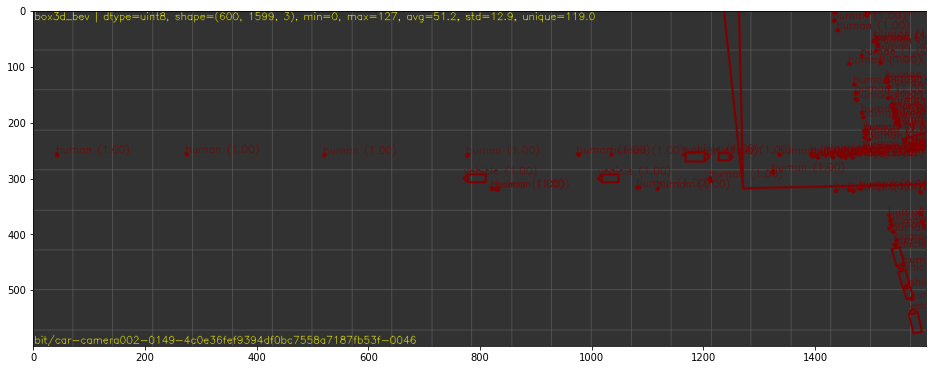

get_scan: 0 ms


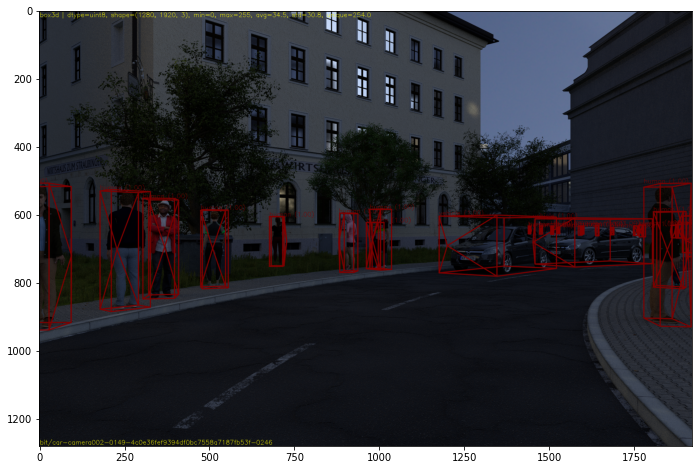

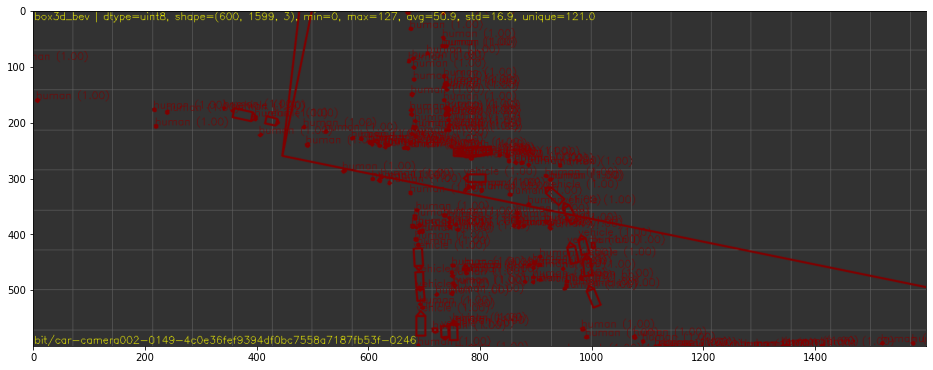

get_scan: 0 ms


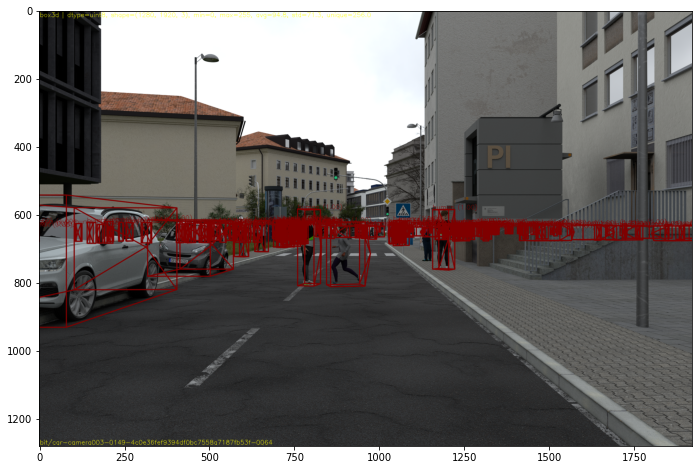

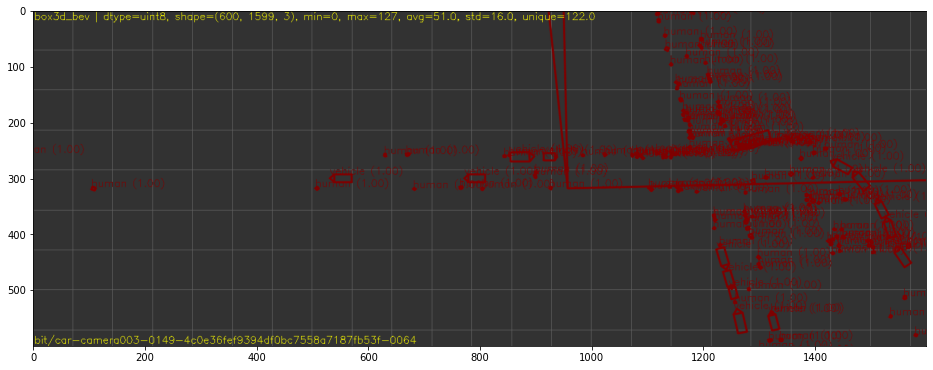

In [8]:
config.data_use_world_coordinates = False
config.data_sequences = [149]
dataset = KIADataset(config, SPLIT_TRAIN, InputType=MyInput, OutputType=MyOutput)
visualize(dataset)